# Graphical analysis of the epidemic dynamics of COVID-19 in France.

> Visualization of the variations in the speed of the epidemic spread over time.


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import requests
import datetime
from IPython.display import display, Markdown
import data
import preprocess

In [5]:
from data.viz import *

## Données de DataAgainst Covid-19

Les données utilisées sont celles de DataAgainst COVID-19 (aka opencovid19-fr) [github.com/opencovid19-fr/data]. Elles sont mises à jour quotidiennement.


In [10]:
file_name = "data/opencovid19-fr-chiffres-cles.csv"
url = 'https://raw.githubusercontent.com/opencovid19-fr/data/master/dist/chiffres-cles.csv'
myfile = requests.get(url)
open(file_name, 'wb').write(myfile.content)
data = pd.read_csv('data/opencovid19-fr-chiffres-cles.csv')

In [11]:
data.columns

Index(['date', 'granularite', 'maille_code', 'maille_nom', 'cas_confirmes',
       'cas_ehpad', 'cas_confirmes_ehpad', 'cas_possibles_ehpad', 'deces',
       'deces_ehpad', 'reanimation', 'hospitalises',
       'nouvelles_hospitalisations', 'nouvelles_reanimations', 'gueris',
       'depistes', 'source_nom', 'source_url', 'source_archive',
       'source_type'],
      dtype='object')

In [12]:
data.tail(n=10)

,date,granularite,maille_code,maille_nom,cas_confirmes,cas_ehpad,cas_confirmes_ehpad,cas_possibles_ehpad,deces,deces_ehpad,reanimation,hospitalises,nouvelles_hospitalisations,nouvelles_reanimations,gueris,depistes,source_nom,source_url,source_archive,source_type
51004,2021-04-17,region,REG-28,Normandie,NaN,NaN,NaN,NaN,2855.0,NaN,220.0,1502.0,71.0,11.0,11318.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51005,2021-04-17,region,REG-32,Hauts-de-France,NaN,NaN,NaN,NaN,7921.0,NaN,698.0,3495.0,120.0,25.0,31191.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51006,2021-04-17,region,REG-44,Grand Est,NaN,NaN,NaN,NaN,9308.0,NaN,489.0,2632.0,99.0,27.0,33136.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51007,2021-04-17,region,REG-52,Pays de la Loire,NaN,NaN,NaN,NaN,2409.0,NaN,134.0,873.0,71.0,17.0,10923.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51008,2021-04-17,region,REG-53,Bretagne,NaN,NaN,NaN,NaN,1414.0,NaN,130.0,801.0,46.0,12.0,6352.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51009,2021-04-17,region,REG-75,Nouvelle-Aquitaine,NaN,NaN,NaN,NaN,3352.0,NaN,255.0,1297.0,48.0,7.0,14123.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51010,2021-04-17,region,REG-76,Occitanie,NaN,NaN,NaN,NaN,3933.0,NaN,407.0,1849.0,119.0,29.0,17884.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51011,2021-04-17,region,REG-84,Auvergne-Rhône-Alpes,NaN,NaN,NaN,NaN,10527.0,NaN,677.0,3751.0,130.0,33.0,44118.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51012,2021-04-17,region,REG-93,Provence-Alpes-Côte d'Azur,NaN,NaN,NaN,NaN,7150.0,NaN,572.0,3202.0,126.0,27.0,34542.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr
51013,2021-04-17,region,REG-94,Corse,NaN,NaN,NaN,NaN,181.0,NaN,15.0,88.0,2.0,1.0,815.0,NaN,OpenCOVID19-fr,NaN,NaN,opencovid19-fr


In [8]:
for a in data[["maille_code", "maille_nom"]].groupby(["maille_code", "maille_nom"]):
    print(f"{a[0]}")

('COM-974', 'La Réunion')
('COM-977', 'Saint-Barthélemy')
('COM-978', 'Saint-Martin')
('COM-986', 'Wallis et Futuna')
('COM-987', 'Polynésie française')
('COM-988', 'Nouvelle-Calédonie')
('DEP-01', 'Ain')
('DEP-02', 'Aisne')
('DEP-03', 'Allier')
('DEP-04', 'Alpes-de-Haute-Provence')
('DEP-05', 'Hautes-Alpes')
('DEP-06', 'Alpes-Maritimes')
('DEP-07', 'Ardèche')
('DEP-08', 'Ardennes')
('DEP-09', 'Ariège')
('DEP-10', 'Aube')
('DEP-11', 'Aude')
('DEP-12', 'Aveyron')
('DEP-13', 'Bouches-du-Rhône')
('DEP-14', 'Calvados')
('DEP-15', 'Cantal')
('DEP-16', 'Charente')
('DEP-17', 'Charente-Maritime')
('DEP-18', 'Cher')
('DEP-19', 'Corrèze')
('DEP-21', "Côte-d'Or")
('DEP-22', "Côtes-d'Armor")
('DEP-23', 'Creuse')
('DEP-24', 'Dordogne')
('DEP-25', 'Doubs')
('DEP-26', 'Drôme')
('DEP-27', 'Eure')
('DEP-28', 'Eure-et-Loir')
('DEP-29', 'Finistère')
('DEP-2A', 'Corse-du-Sud')
('DEP-2B', 'Haute-Corse')
('DEP-30', 'Gard')
('DEP-31', 'Haute-Garonne')
('DEP-32', 'Gers')
('DEP-33', 'Gironde')
('DEP-34', 'Hér

In [9]:
data = enable_time_series_plot(data, timein_field="date", timeseries_field_out="t")

c:\ProjetCovid\covidestat\viz.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  in_df[timeseries_field_out] = pd.to_datetime(


The raw data as well as the data with the moving average over 7 days are calculated. We only observe reanimations, hospitalizations and deaths. The data of confirmed cases have been insufficient for a long time to allow an intelligent analysis of the epidemic.

In the graphs below we analyze three types of data:

* the raw data of admissions to intensive care and deaths ;
* these same data weighted over 7 days;
* these weighted data normalized by the number of people in intensive care.

This third graph therefore gives an indication of acceleration or deceleration, even when the data are of very different sizes.


,deces,deces_ehpad,reanimation,hospitalises,cas_confirmes,reanimation_cumul,hospitalises_cumul,deces_jour,deces_jour_jour,deces_ehpad_jour,...,deces_ehpad_jour_mma_jour,deces_jour_prop,deces_ehpad_jour_prop,reanimation_jour_prop,hospitalises_jour_prop,cas_confirmes_jour_prop,reanimation_cumul_jour_prop,hospitalises_cumul_jour_prop,reanimation_solde_vivant_jour_prop,deces_jour_mma_jour_prop
t,,,,,,,,,,,,,,,,,,,,,
2021-04-08,71944.0,24480.0,5705.0,30555.0,3560764.0,1031886.0,7288202.0,343.0,-78.0,0.0,...,0.0,0.004051,0.0,0.014924,0.009229,0.0,0.005311,0.004096,0.066007,0.017157
2021-04-09,72243.0,24480.0,5757.0,30326.0,3560764.0,1037643.0,7318528.0,299.0,-44.0,0.0,...,0.0,0.004032,0.0,0.012482,0.007523,0.0,0.005351,0.004110,0.063078,-0.000490
2021-04-10,72450.0,24480.0,5769.0,30238.0,3560764.0,1043412.0,7348766.0,207.0,-92.0,0.0,...,0.0,0.004064,0.0,0.012282,0.006387,0.0,0.005389,0.004120,0.063319,0.010674
2021-04-11,72626.0,24480.0,5838.0,30671.0,3560764.0,1049250.0,7379437.0,176.0,-31.0,0.0,...,0.0,0.004036,0.0,0.012162,0.006125,0.0,0.005427,0.004128,0.062375,-0.004386
2021-04-12,73011.0,24480.0,5916.0,31262.0,3560764.0,1055166.0,7410699.0,385.0,209.0,0.0,...,0.0,0.004383,0.0,0.011663,0.006192,0.0,0.005462,0.004137,0.065754,0.083929
2021-04-13,73335.0,24480.0,5952.0,31226.0,3560764.0,1061118.0,7441925.0,324.0,-61.0,0.0,...,0.0,0.004198,0.0,0.007825,0.002685,0.0,0.005475,0.004131,0.059548,-0.039443
2021-04-14,73632.0,24480.0,5902.0,30868.0,3560764.0,1067020.0,7472793.0,297.0,-27.0,0.0,...,0.0,0.003940,0.0,0.004187,-0.000167,0.0,0.005468,0.004113,0.053348,-0.061054
2021-04-15,73928.0,24480.0,5924.0,30668.0,3560764.0,1072944.0,7503461.0,296.0,-1.0,0.0,...,0.0,0.003834,0.0,0.005281,0.000526,0.0,0.005467,0.004098,0.053125,-0.023690
2021-04-16,74234.0,24480.0,5914.0,30472.0,3560764.0,1078858.0,7533933.0,306.0,10.0,0.0,...,0.0,0.003832,0.0,0.003792,0.000684,0.0,0.005457,0.004084,0.051887,0.003516


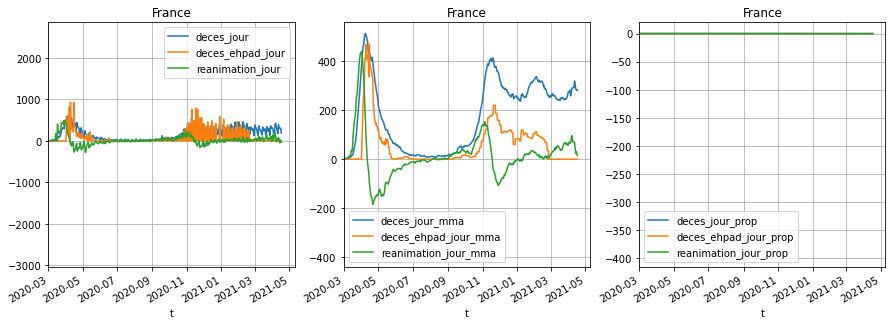

In [10]:
maille_active = 'FRA'
fra = data_preproc(data, maille_active)
fra.tail(10)

"solde vivant" en réanimation: `nombre entrant` - `nombre sortant vivant` de réanimation.

## Epidemic evolution


In [13]:
def plots_maille_code(maille_active='FRA', **kwargs):
    fra = data_preproc(data, maille_active)
    plt.close()
    # plot_field_loops(fra, "deces_ehpad", center=False, maille_active=maille_active)
    plot_field_loops(fra, "hospitalises_cumul", [7], center=True, maille_active=maille_active, **kwargs)
    plot_field_loops(fra, "reanimation_cumul", [7], center=True, maille_active=maille_active, **kwargs)
    plot_field_loops(fra, "deces", center=True, maille_active=maille_active, **kwargs)
    if maille_active == "FRA":
        plt.show()
        display(Markdown(
            "It's possible to analyse french cases"
            + " the number of cases is smoothed over 14 days with a triangular window."
        ))
        plot_field_loops(
            fra, "cas_confirmes", [14], center=True, maille_active=maille_active,
            win_type='triang', **kwargs
        )
    return fra


C:\Users\Jihene Belgaied\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


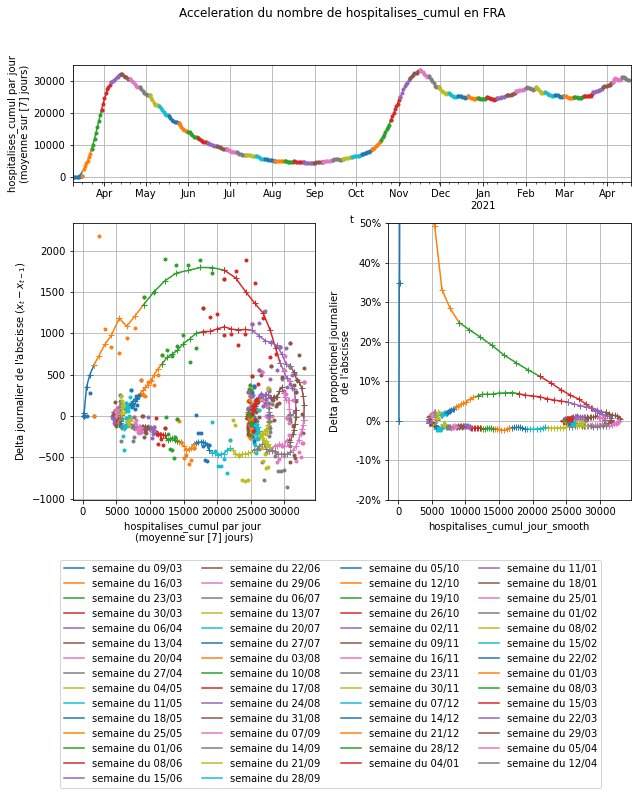

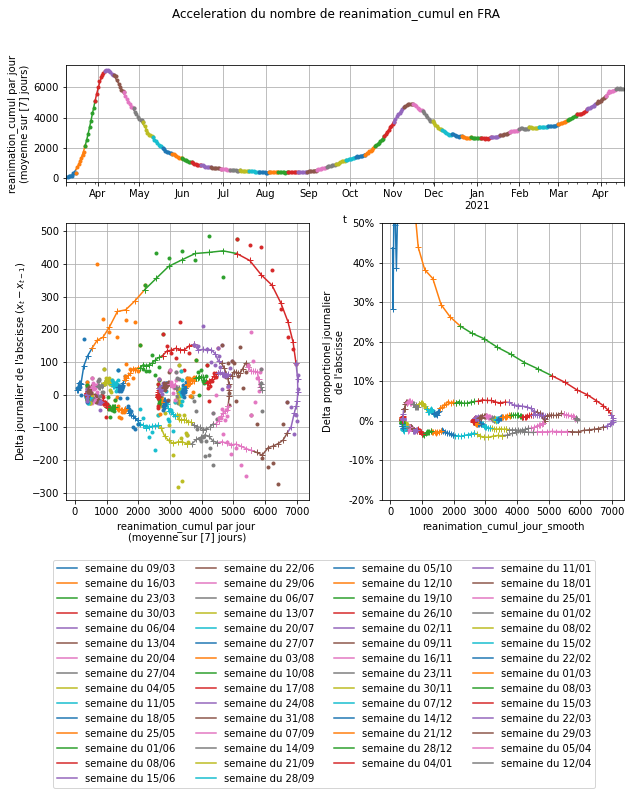

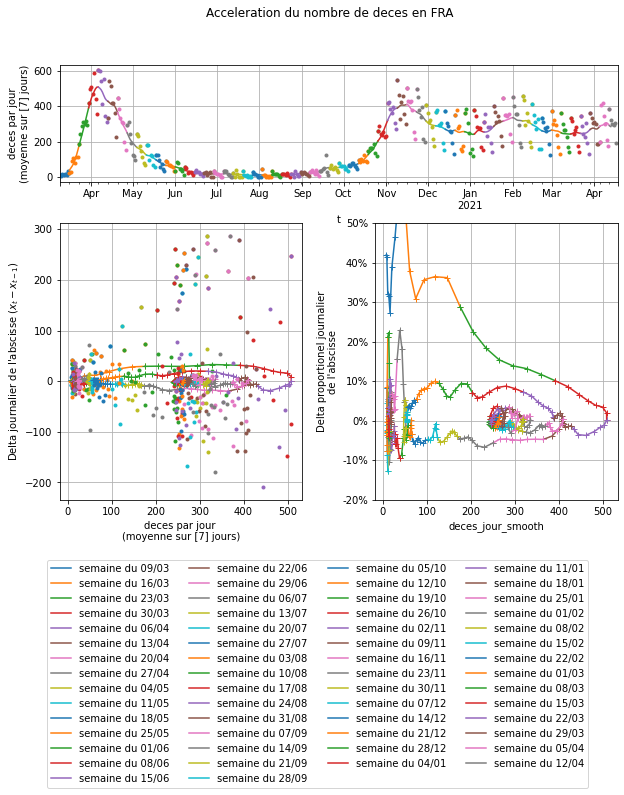

Pour la France le nombre de cas peut-être analysé. Contrairement aux autres quantités le nombre de cas est lissé sur 14 jours avec une fenêtre triangulaire.

C:\Users\Jihene Belgaied\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


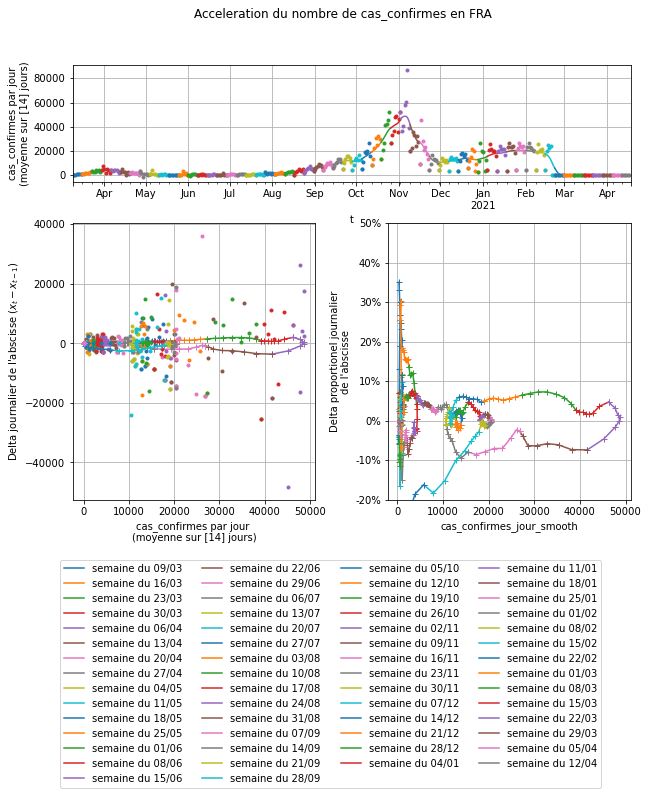

In [14]:
_ = plots_maille_code(maille_active='FRA')

It is interesting to zoom in on the data since the end of containment.

C:\Users\Jihene Belgaied\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


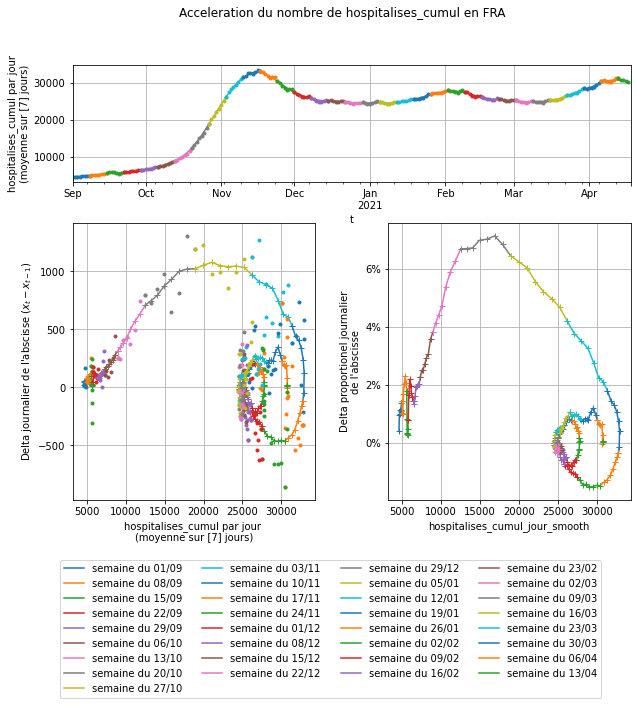

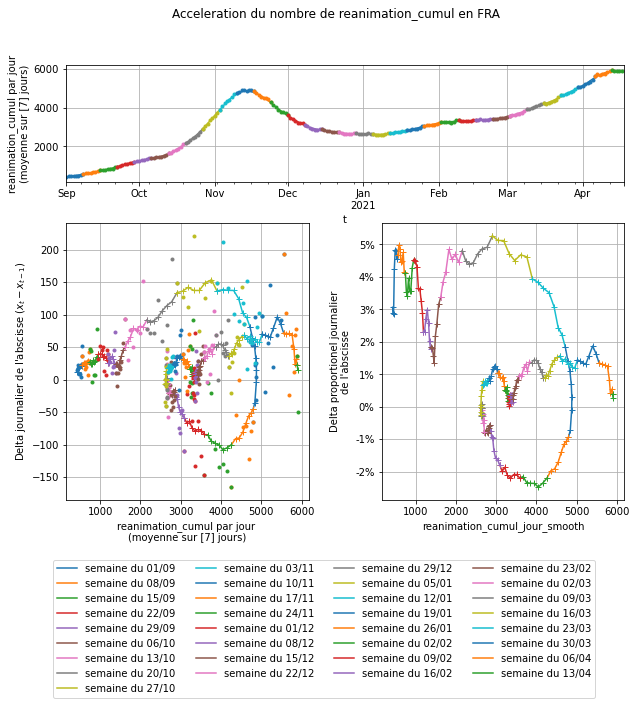

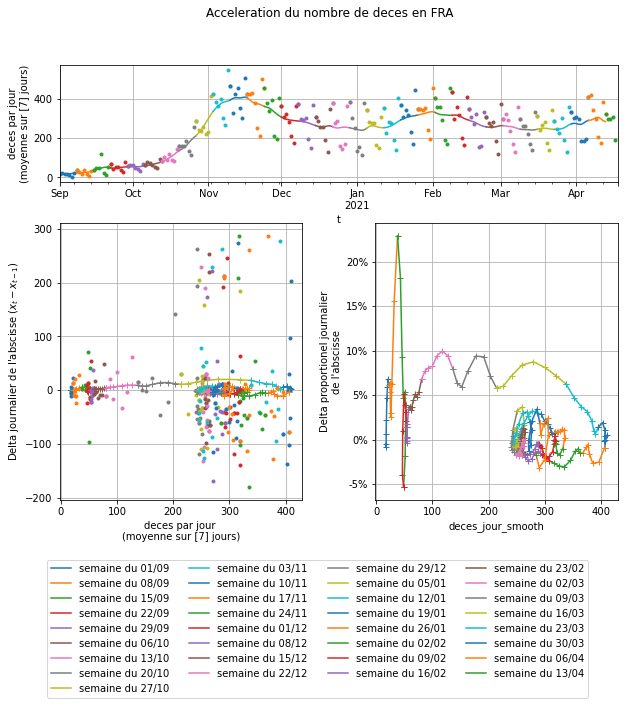

Pour la France le nombre de cas peut-être analysé. Contrairement aux autres quantités le nombre de cas est lissé sur 14 jours avec une fenêtre triangulaire.

C:\Users\Jihene Belgaied\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


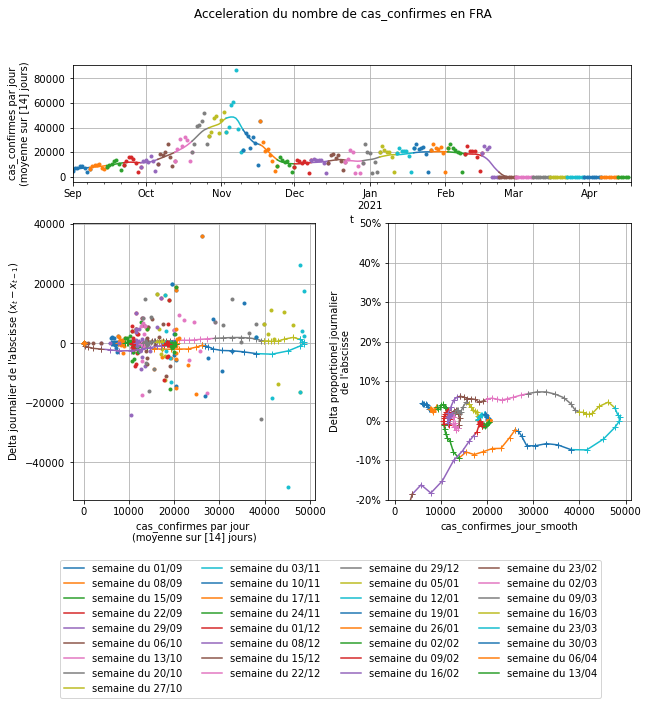

In [15]:
_ = plots_maille_code(maille_active='FRA', start_date='2021-01-01')

These curves evolve in loops (or spirals in case of several successive waves):

* At the beginning of the epidemic the curves start at the origin;
* then follows a rapid acceleration in the upper part of the graph;
* with the containment the increase from day to day slows down, this can be seen in the negative slope from the week of March 23;
* the epidemic reaches its peak in the week of April 06;
* The summer period indicates that the epidemic was not going to disappear because it did not return to its origin;
* Since August 15, the number of hospitalizations and resuscitation increases and it is the second week of September that seems to indicate that a second wave has begun.


### Ile-de-France virus evolution

Ici les mêmes graphiques sont présentés pour l'île de France. 

C:\Users\Jihene Belgaied\AppData\Roaming\Python\Python38\site-packages\pandas\plotting\_matplotlib\tools.py:21: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.subplots_adjust(bottom=0.2)
C:\Users\Jihene Belgaied\AppData\Roaming\Python\Python38\site-packages\pandas\plotting\_matplotlib\tools.py:21: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.subplots_adjust(bottom=0.2)
C:\Users\Jihene Belgaied\AppData\Roaming\Python\Python38\site-packages\pandas\plotting\_matplotlib\tools.py:21: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.subplots_adjust(bottom=0.2)


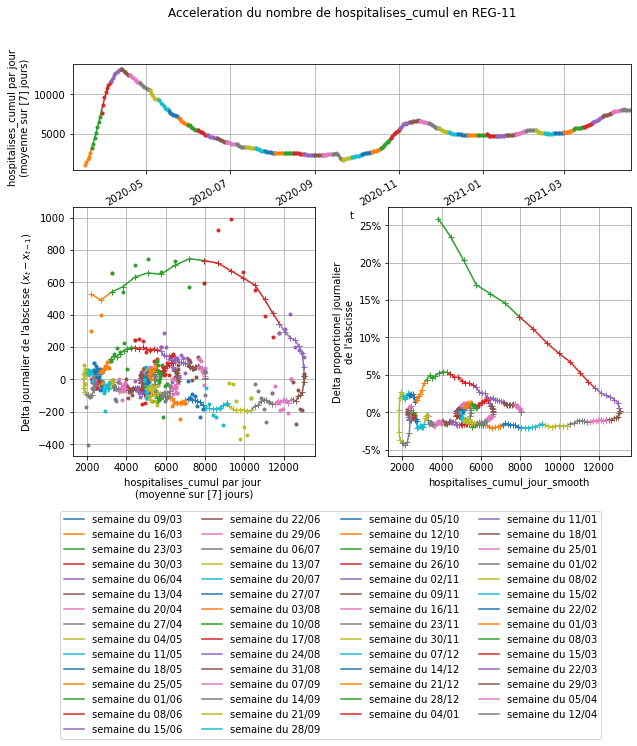

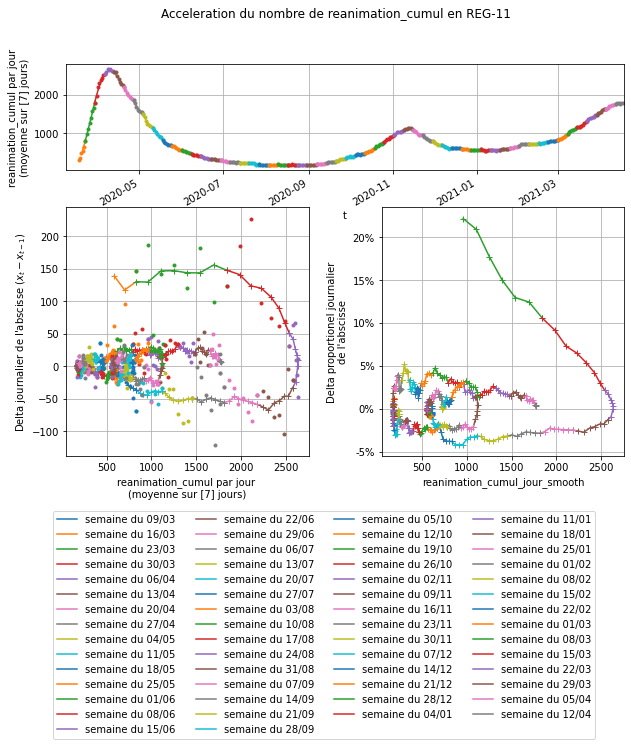

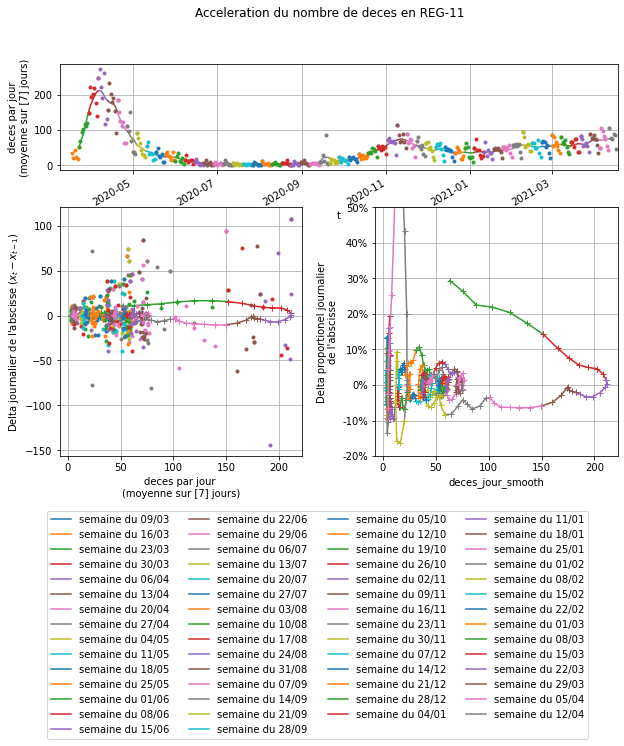

In [16]:
_ = plots_maille_code(maille_active='REG-11')

C:\Users\Jihene Belgaied\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


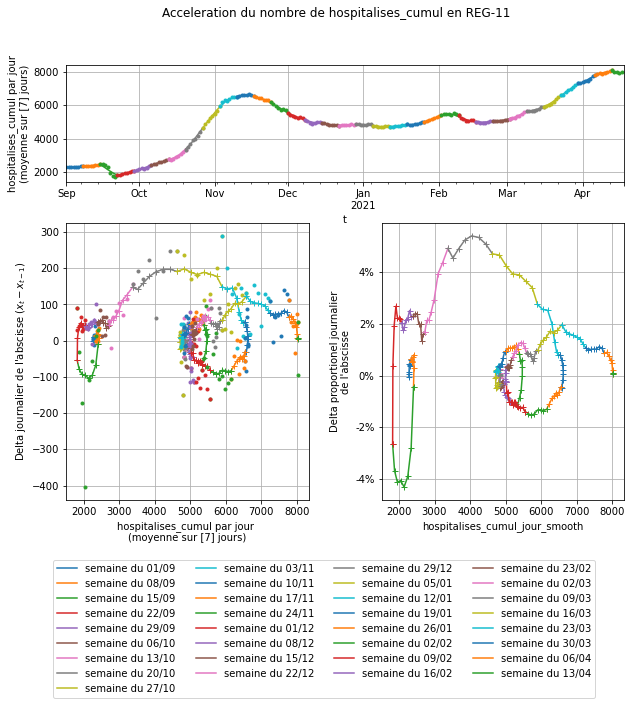

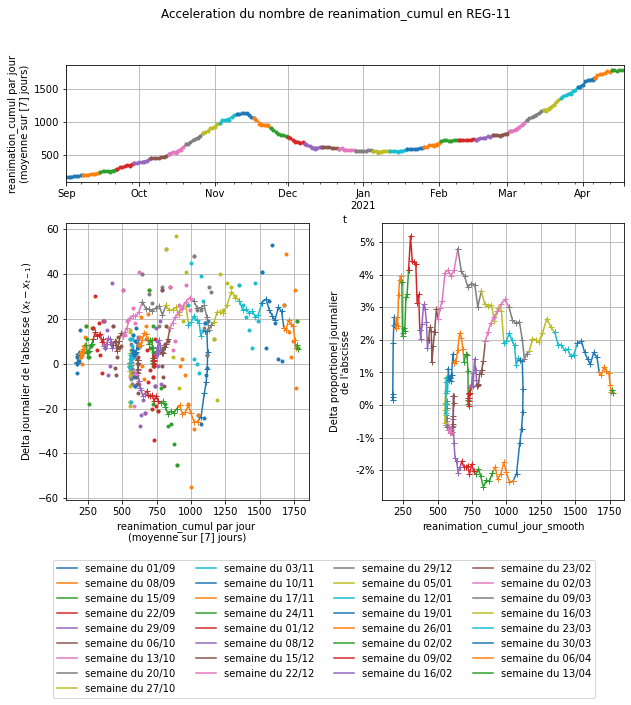

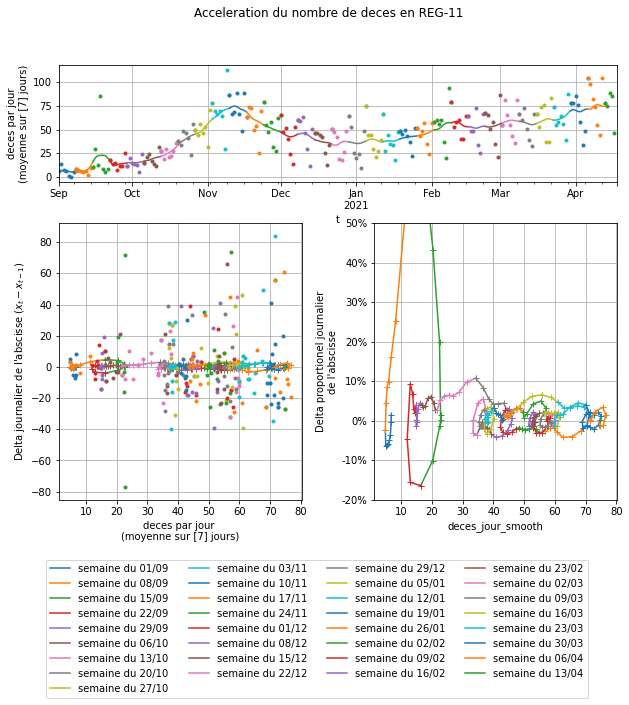

In [17]:
_ = plots_maille_code(maille_active='REG-11', start_date='2021-01-01')

## Charts for each region

-réanimation 
-décès 

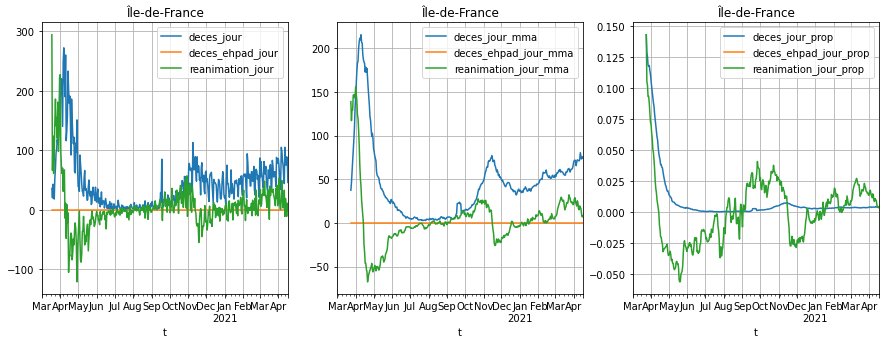

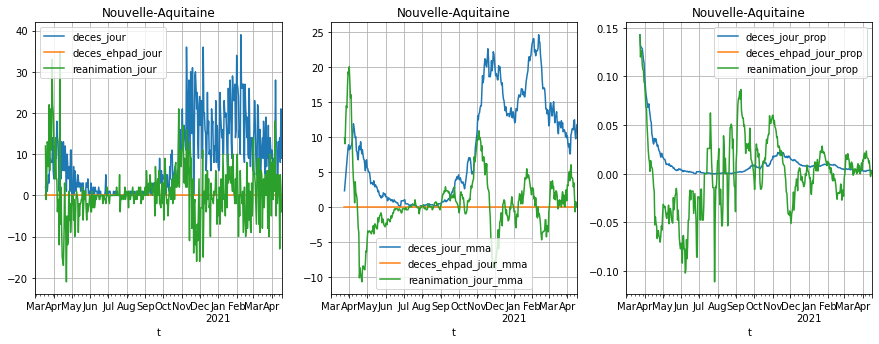

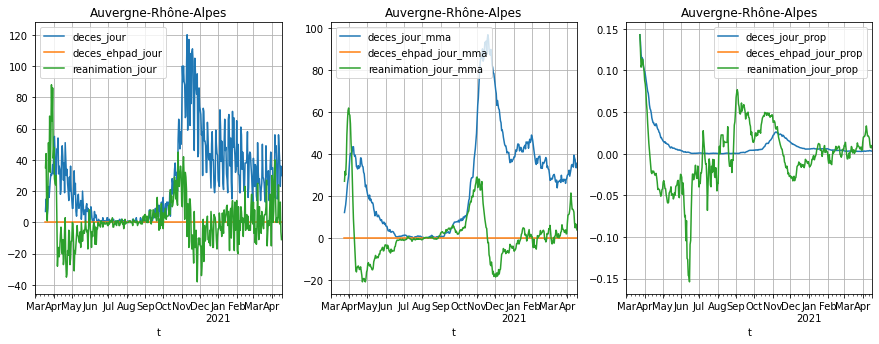

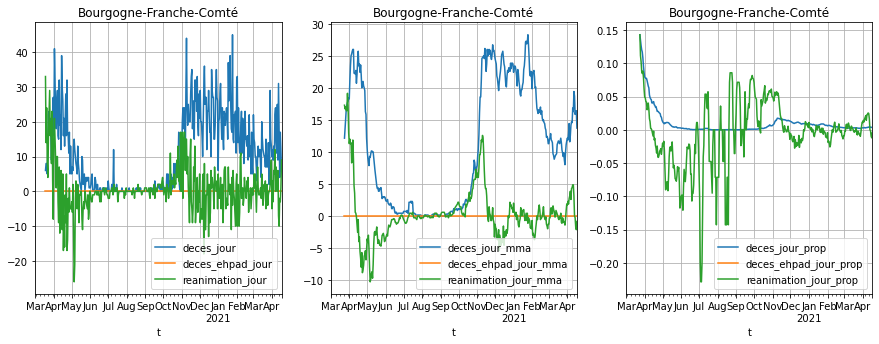

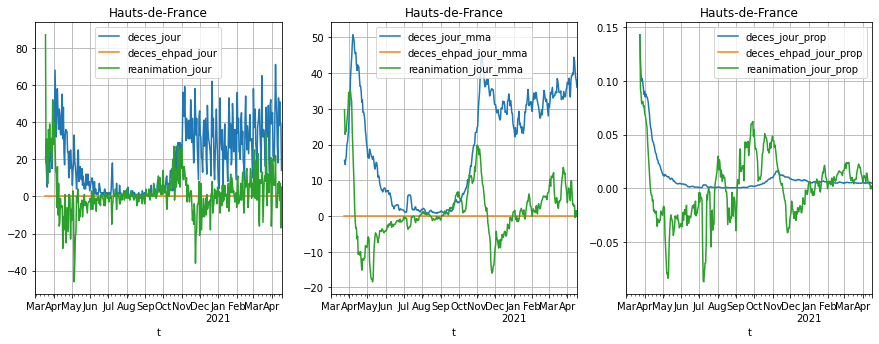

...

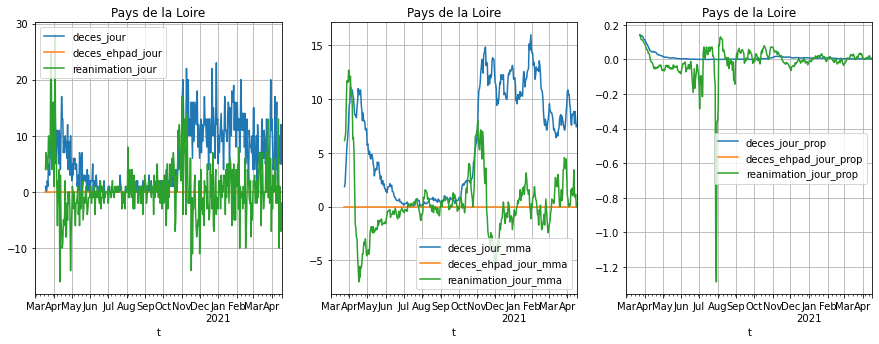

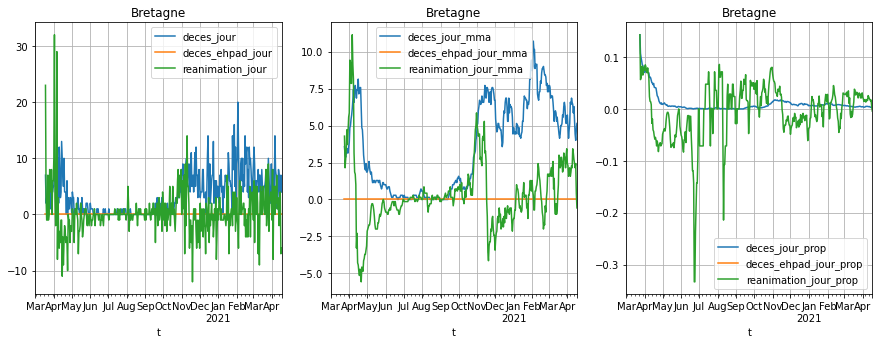

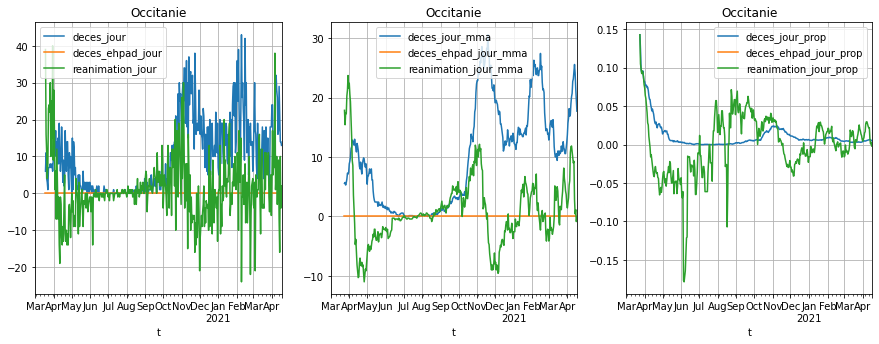

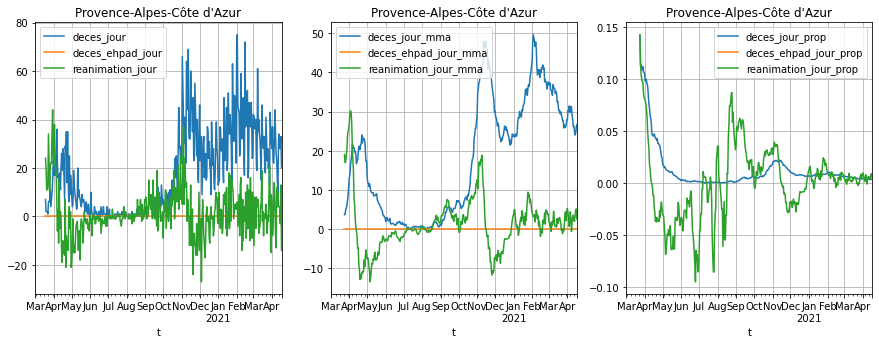

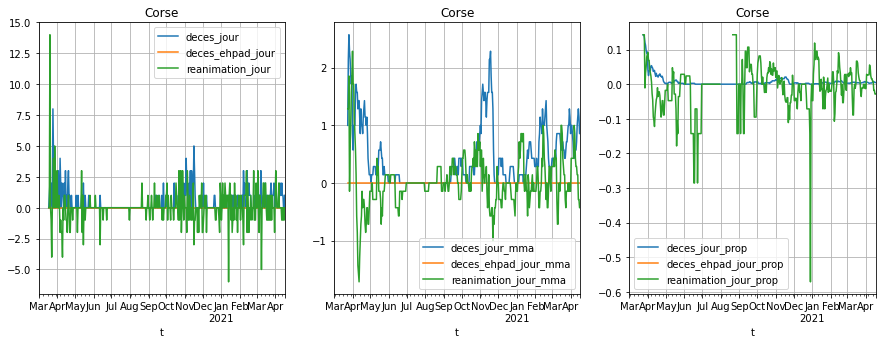

In [18]:
list_reg = [r for r in data["maille_code"].unique() if "REG" in r]
for reg in list_reg:
    data_preproc(data, reg)